# Prac 06.1

For this homework we are not going to provide you with any code, you'll have to build the face detector on your own.

In [6]:
import requests
url = 'https://huggingface.co/datasets/navagg/PyVHR/resolve/main/shape_predictor_68_face_landmarks.dat'
predictor_path = 'shape_predictor_68_face_landmarks.dat'

# Check if the file already exists, if not, download it
try:
    with open(predictor_path, 'rb') as f:
        print(f"{predictor_path} already exists.")
except FileNotFoundError:
    response = requests.get(url)
    with open(predictor_path, 'wb') as file:
        file.write(response.content)
    print(f'Downloaded {predictor_path}')

Downloaded shape_predictor_68_face_landmarks.dat


### Step 0

Run the necessary imports.

In [1]:
!pip install dlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.4/3.4 MB 54.3 MB/s eta 0:00:00a 0:00:01
  Preparing metadata (setup.py) ... done
  Created wheel for dlib: filename=dlib-19.24.6-cp310-cp310-linux_x86_64.whl size=3374770 sha256=0ef712411b61cd8d2ec398b3f3f694ff56557e2515fc4f88b1d6519c46916c81
  Stored in directory: /root/.cache/pip/wheels/7c/1d/d1/e69ceb001441acedfa6156acda6c1856699e260ea1a9e6dcc4
Successfully built dlib


In [3]:
import cv2
import matplotlib.pyplot as plt
import dlib

### Step 1

Load an image (any image that contains faces).

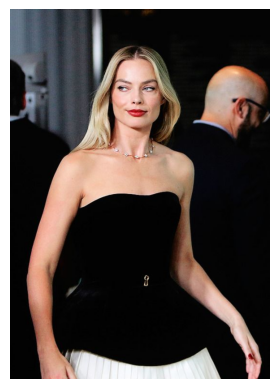

In [20]:
# Load image
img = cv2.imread('/kaggle/input/faces-pics/b93dd8f71e4edc19d2ae927e1eb317dc.jpg')
# Convert it to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Plot it
plt.imshow(img)
plt.axis('off') 
plt.show()

### Step 2

Load the dlib face predictor.

In [21]:
face_predictor = dlib.shape_predictor(predictor_path)
face_detector = dlib.get_frontal_face_detector()

print("Face predictor and detector loaded successfully.")

Face predictor and detector loaded successfully.


### Step 3

Run the predictor on your image.

In [23]:
faces = face_detector(img)  
for face in faces:
    cv2.rectangle(img, (face.left(), face.top()), (face.right(), face.bottom()), (0, 255, 0), 2)

    landmarks = face_predictor(img, face)
    
    for n in range(0, 68):  
        x = landmarks.part(n).x
        y = landmarks.part(n).y
        cv2.circle(img, (x, y), 2, (255, 0, 0), -1)  


### Step 4

Draw bounding boxes around the detected faces and plot the image. Use different colour for each face.

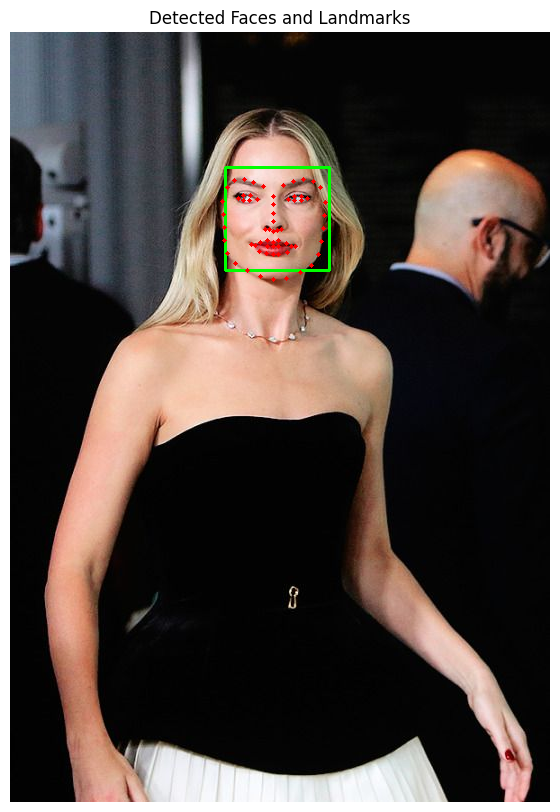

In [25]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title('Detected Faces and Landmarks')
plt.show()

### Step 5 (optional)

Repeat the process with a different and more challenging image (more faces, smaller faces, people with glasses, hats, helmets, etc.). How does the detector perform? Is it robust?

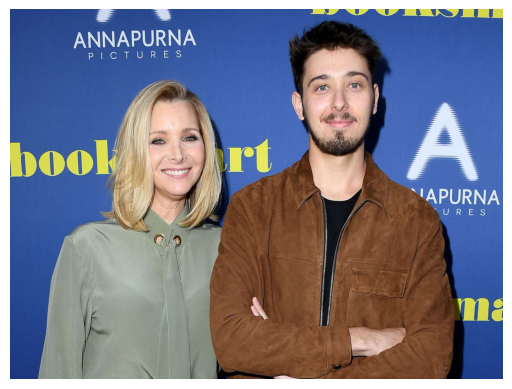

In [30]:
# Load image
img = cv2.imread('/kaggle/input/faces-data/lisa-kudrow-son-julian-1-94e66f642a6f4ecaa85f136366865780.jpg')
# Convert it to RGB
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Plot it
plt.imshow(img)
plt.axis('off') 
plt.show()

In [31]:
faces = face_detector(img)  
for face in faces:

    cv2.rectangle(img, (face.left(), face.top()), (face.right(), face.bottom()), (0, 255, 0), 2)
    landmarks = face_predictor(img, face)
    
    for n in range(0, 68): 
        x = landmarks.part(n).x
        y = landmarks.part(n).y
        cv2.circle(img, (x, y), 2, (255, 0, 0), -1)  


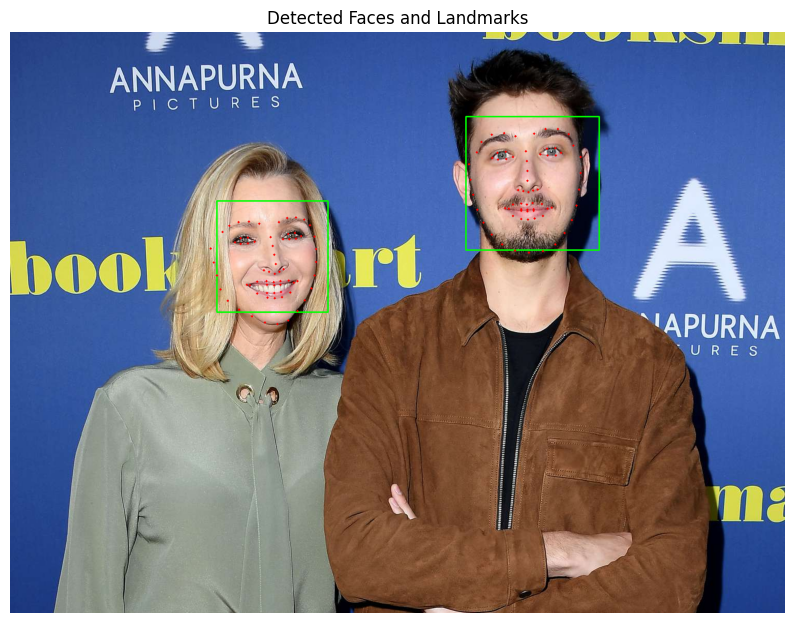

In [32]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.axis('off')  # Hide axes
plt.title('Detected Faces and Landmarks')
plt.show()

## Prac 06.2

In this homework, you are going to use and compare two different trackers (of your liking) and compare the results.

In [33]:
!pip install pytube moviepy


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 388.3/388.3 kB 10.3 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 26.9/26.9 MB 39.6 MB/s eta 0:00:00:00:0100:01
  Created wheel for moviepy: filename=moviepy-1.0.3-py3-none-any.whl size=110721 sha256=a155cf2e497e160163d08b81f115fba74a1e054bb272f4e96ce80675b73911e5
  Stored in directory: /root/.cache/pip/wheels/96/32/2d/e10123bd88fbfc02fed53cc18c80a171d3c87479ed845fa7c1
Successfully built moviepy
  Attempting uninstall: decorator
    Found existing installation: decorator 5.1.1
    Uninstalling decorator-5.1.1:
      Successfully uninstalled decorator-5.1.1


### Step 1
Decide what video you are going to use for this homework, select an object and generate the template. You can use any video you want (your own, from Youtube, etc.)
and track any object you want (e.g. a car, a pedestrian, etc.).

In [39]:
from pytube import YouTube
from moviepy.editor import VideoFileClip

def download_and_trim_video(video_url, start_time, end_time, output_filename):
    try:
        # Step 1: Download the video
        yt = YouTube(video_url)
        print(1)
        # Check for streams and select the first available stream
        stream = yt.streams.filter(progressive=True, file_extension='mp4').first()
        if stream is None:
            print("No suitable stream found.")
            return
        print(2)
        download_path = stream.download()

        # Step 2: Trim the video to the desired segment
        video_clip = VideoFileClip(download_path)
        trimmed_clip = video_clip.subclip(start_time, end_time)

        # Save the trimmed video
        trimmed_clip.write_videofile(output_filename, codec="libx264")

        # Clean up
        video_clip.close()
        trimmed_clip.close()
        print(f"Trimmed video saved as: {output_filename}")

    except Exception as e:
        print(f"An error occurred: {e}")

# Parameters
video_url = "https://youtu.be/i0M4ARe9v0Y?si=b_ctAtpERcYuT0gE"
start_time = 8  # start at 8 seconds
end_time = 18   # end at 18 seconds
output_filename = "trimmed_video.mp4"

download_and_trim_video(video_url, start_time, end_time, output_filename)


1
An error occurred: HTTP Error 400: Bad Request


In [44]:
!pip install yt_dlp

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 171.3/171.3 kB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 53.6 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.1/164.1 kB 10.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 12.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 55.7 MB/s eta 0:00:00:00:01
  Attempting uninstall: websockets
    Found existing installation: websockets 12.0
    Uninstalling websockets-12.0:
      Successfully uninstalled websockets-12.0


In [53]:
!pip install ffmpeg --upgrade

  Preparing metadata (setup.py) ... done
  Created wheel for ffmpeg: filename=ffmpeg-1.4-py3-none-any.whl size=6082 sha256=f853e92773d08d44b3f4ed7a041a1c31d0f2e629204c0fb7e2aa366ef0c9355e
  Stored in directory: /root/.cache/pip/wheels/8e/7a/69/cd6aeb83b126a7f04cbe7c9d929028dc52a6e7d525ff56003a
Successfully built ffmpeg


In [135]:
import yt_dlp
from moviepy.video.io.VideoFileClip import VideoFileClip

# Step 1: Download the video
video_url = "https://www.youtube.com/watch?v=i0M4ARe9v0Y"
ydl_opts = {
    'format': 'best',
    'outtmpl': 'downloaded_video.%(ext)s'
}

with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download([video_url])



[youtube] Extracting URL: https://www.youtube.com/watch?v=i0M4ARe9v0Y
[youtube] i0M4ARe9v0Y: Downloading webpage
[youtube] i0M4ARe9v0Y: Downloading ios player API JSON
[youtube] i0M4ARe9v0Y: Downloading mweb player API JSON
[youtube] i0M4ARe9v0Y: Downloading m3u8 information
[info] i0M4ARe9v0Y: Downloading 1 format(s): 18
[download] downloaded_video.mp4 has already been downloaded
[download] 100% of   25.70MiB


### Step 2
Initialize a tracker (e.g. KCF).

In [77]:
!pip install --upgrade opencv-python opencv-contrib-python

In [81]:
tracker = cv2.TrackerMIL_create()

### Step 3
Run the tracker on the video and the selected object. Run the tracker for around 10-15 frames.

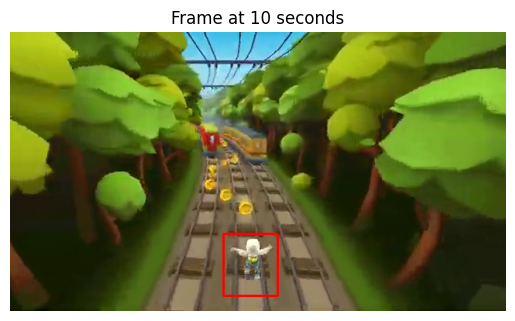

In [110]:
video = cv2.VideoCapture('/kaggle/working/downloaded_video.mp4')

time_in_seconds = 10
fps = video.get(cv2.CAP_PROP_FPS)
frame_number = int(time_in_seconds * fps)  

video.set(cv2.CAP_PROP_POS_FRAMES, frame_number)

success, frame = video.read()
if success:
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    bbox = (275, 260, 70, 80) 
    x, y, w, h = bbox
    cv2.rectangle(frame_rgb, (x, y), (x + w, y + h), (255, 0, 0), 2)

    plt.imshow(frame_rgb)
    plt.axis('off') 
    plt.title("Frame at 10 seconds")
    plt.show()
else:
    print("Failed to read frame.")


In [111]:
bbox = (275, 260, 70, 80)
tracker.init(frame, bbox)

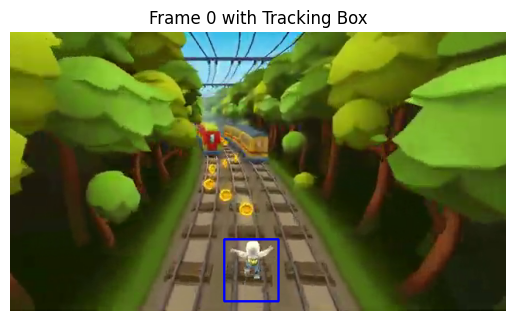

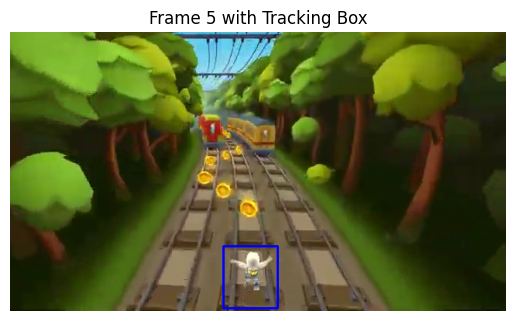

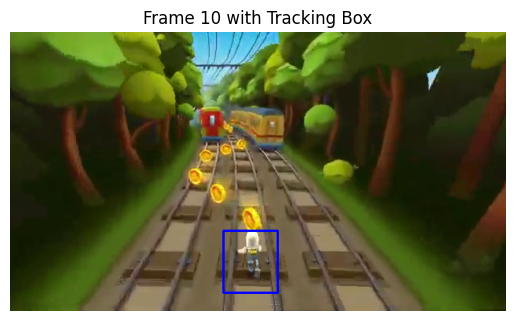

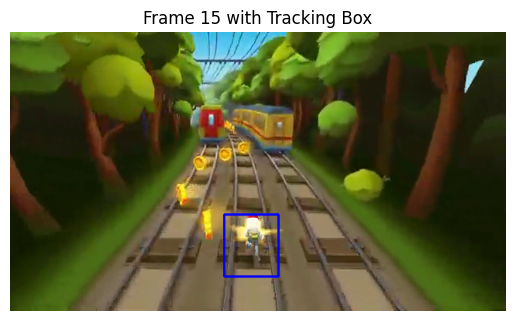

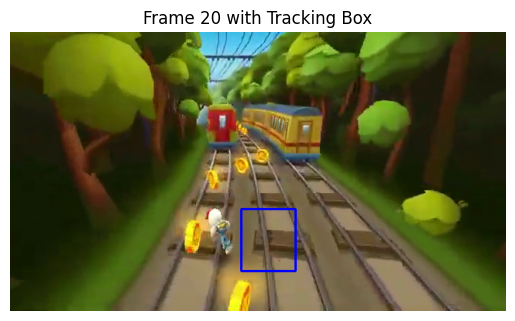

...

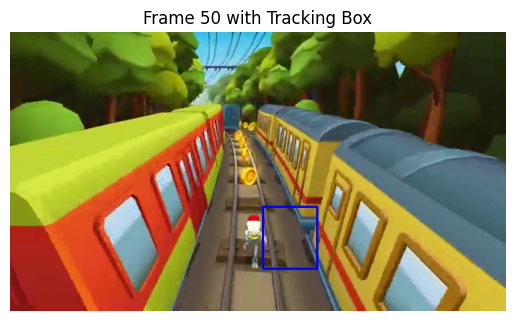

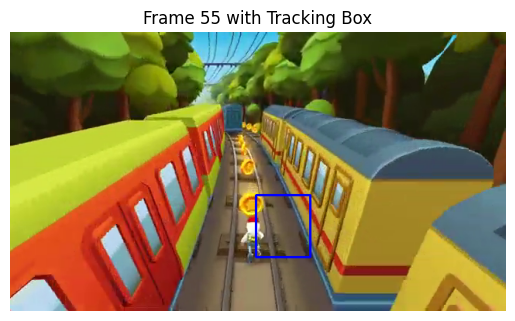

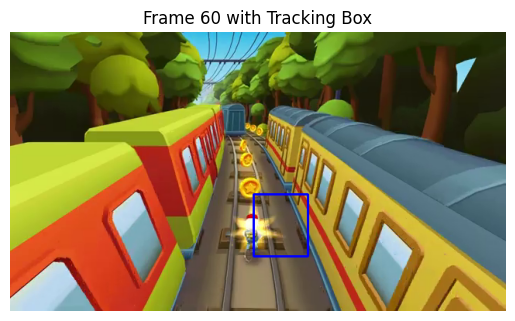

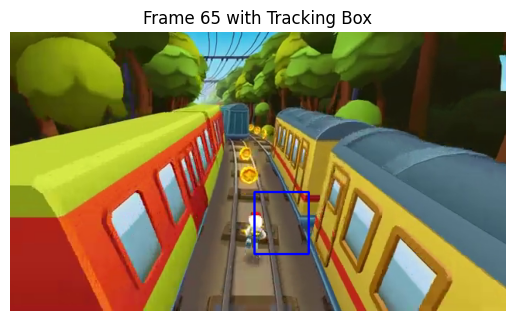

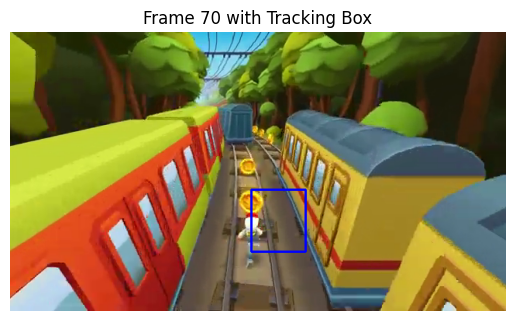

In [112]:
frame_count = 0
max_frames = 15
processed_frames = 0

while processed_frames < max_frames:
    success, frame = video.read()
    if not success:
        break

    if frame_count % 5 == 0:
        success, bbox = tracker.update(frame)

        if success:
            (x, y, w, h) = [int(v) for v in bbox]
            cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))  
        plt.axis('off')
        plt.title(f"Frame {frame_count} with Tracking Box")
        plt.show()

        processed_frames += 1

    frame_count += 1
video.release()

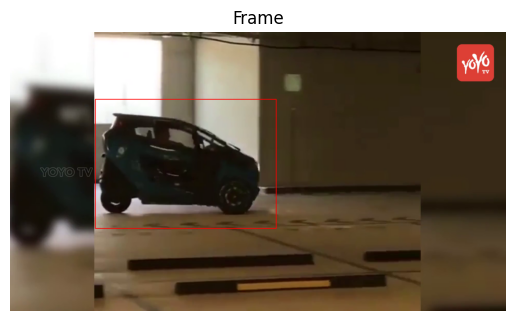

In [121]:
video = cv2.VideoCapture('/kaggle/input/object-tracking-car/car.mp4')

success, frame = video.read()
if success:
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    bbox = (330, 260, 700, 500)  
    x, y, w, h = bbox
    cv2.rectangle(frame_rgb, (x, y), (x + w, y + h), (255, 0, 0), 2)

    plt.imshow(frame_rgb)
    plt.axis('off') 
    plt.title("Frame")
    plt.show()
else:
    print("Failed to read frame.")


In [122]:
bbox = (330, 260, 700, 500) 
tracker.init(frame, bbox)

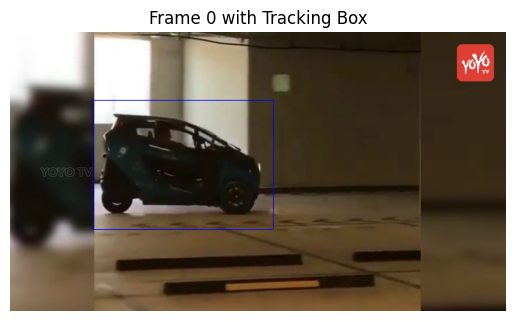

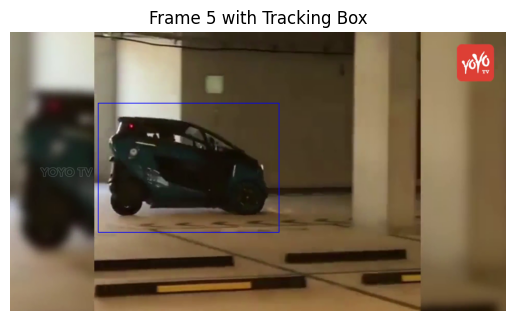

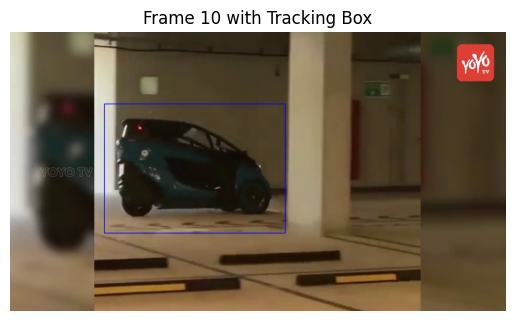

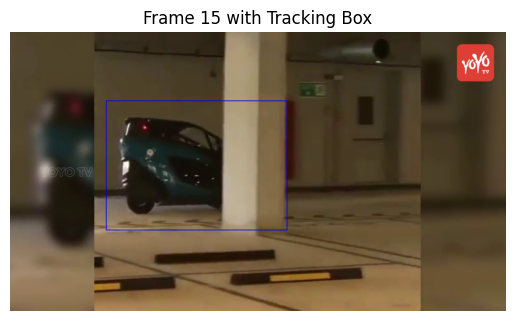

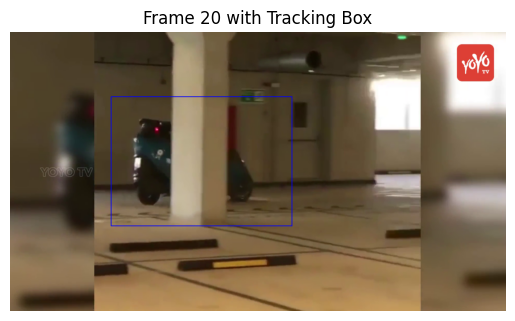

...

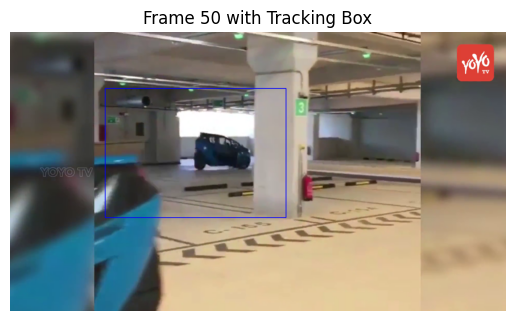

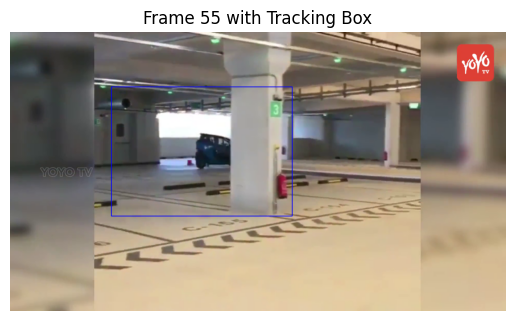

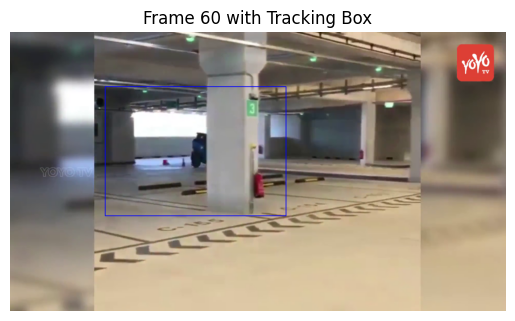

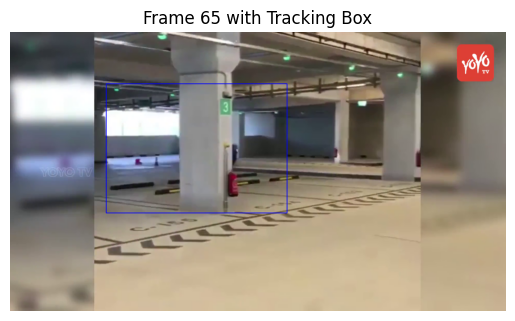

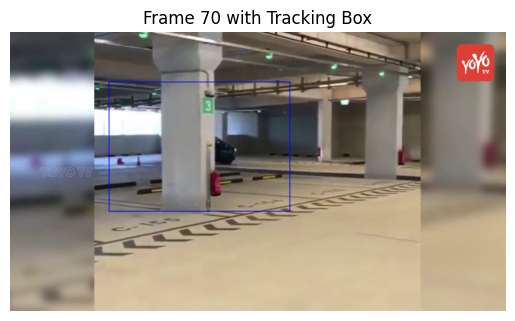

In [123]:
frame_count = 0
max_frames = 15 
processed_frames = 0  

while processed_frames < max_frames:
    success, frame = video.read()
    if not success:
        break

    if frame_count % 5 == 0:
        success, bbox = tracker.update(frame)

        if success:
            (x, y, w, h) = [int(v) for v in bbox]
            cv2.rectangle(frame, (x, y), (x + w, y + h), (255, 0, 0), 2)

        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) 
        plt.axis('off')
        plt.title(f"Frame {frame_count} with Tracking Box")
        plt.show()

        processed_frames += 1

    frame_count += 1

video.release()

### Step 4
Select a different tracker (e.g. CSRT) and repeat steps 2, 3 and 4.

In [132]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.4/870.4 kB 28.5 MB/s eta 0:00:00


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 122MB/s]



0: 384x640 1 car, 257.7ms
Speed: 9.6ms preprocess, 257.7ms inference, 16.9ms postprocess per image at shape (1, 3, 384, 640)


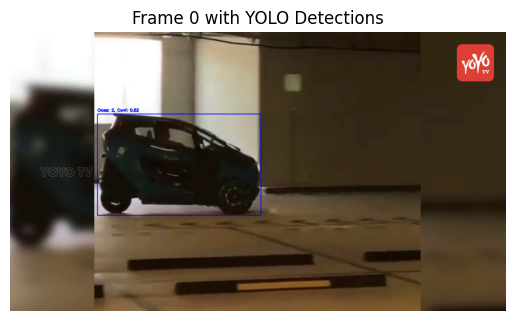


0: 384x640 (no detections), 139.5ms
Speed: 3.0ms preprocess, 139.5ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


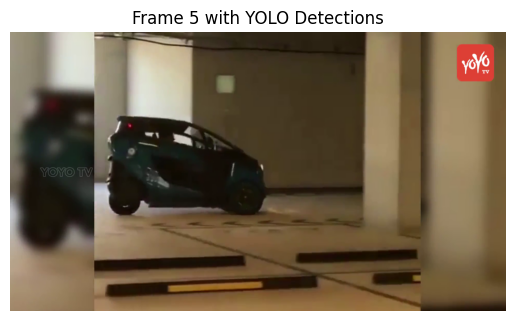


0: 384x640 2 cars, 1 refrigerator, 140.6ms
Speed: 3.7ms preprocess, 140.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


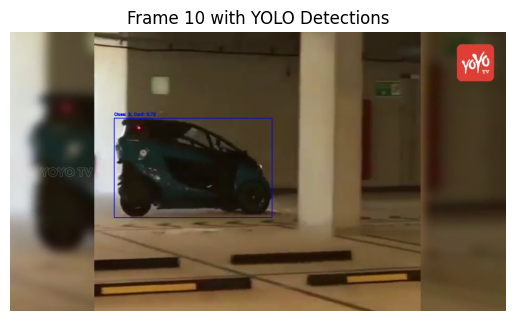


0: 384x640 1 car, 1 bottle, 142.1ms
Speed: 3.8ms preprocess, 142.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


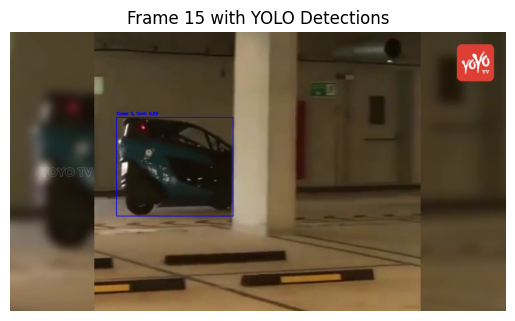


0: 384x640 (no detections), 142.9ms
Speed: 2.8ms preprocess, 142.9ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)


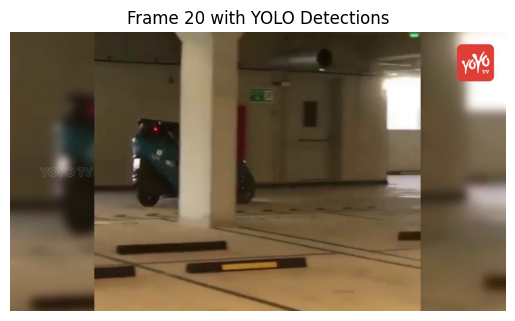


0: 384x640 1 car, 141.2ms
Speed: 3.9ms preprocess, 141.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


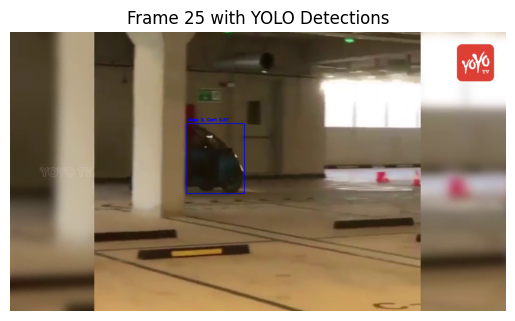


0: 384x640 1 car, 138.4ms
Speed: 2.7ms preprocess, 138.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


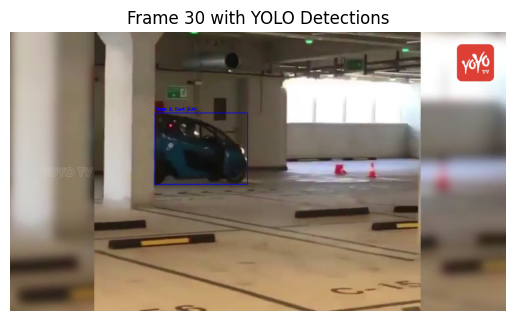


0: 384x640 1 person, 1 car, 1 suitcase, 139.6ms
Speed: 2.8ms preprocess, 139.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


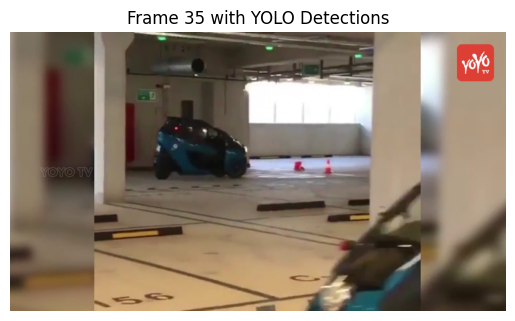


0: 384x640 1 person, 1 car, 1 suitcase, 141.6ms
Speed: 4.1ms preprocess, 141.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


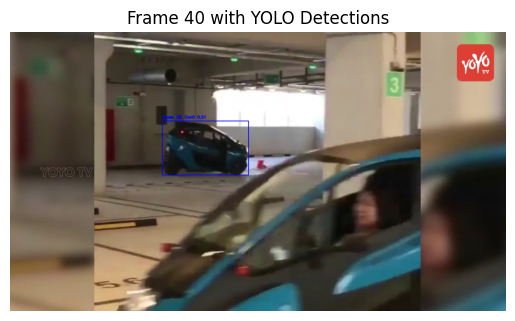


0: 384x640 1 car, 1 suitcase, 2 tvs, 141.7ms
Speed: 2.9ms preprocess, 141.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


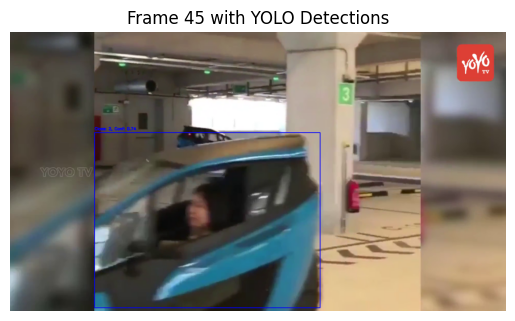


0: 384x640 1 car, 142.5ms
Speed: 3.8ms preprocess, 142.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


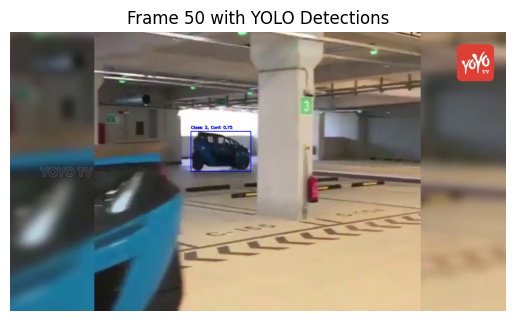


0: 384x640 1 car, 148.8ms
Speed: 3.5ms preprocess, 148.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


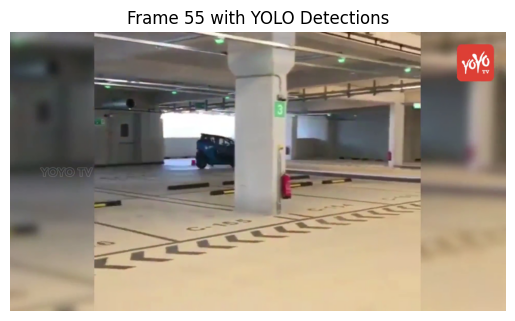


0: 384x640 1 person, 144.9ms
Speed: 3.0ms preprocess, 144.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


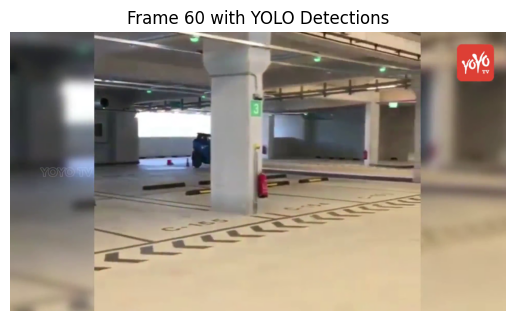


0: 384x640 (no detections), 141.2ms
Speed: 3.0ms preprocess, 141.2ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)


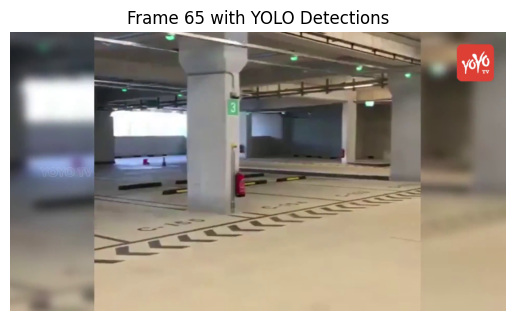


0: 384x640 1 car, 1 train, 142.1ms
Speed: 3.8ms preprocess, 142.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


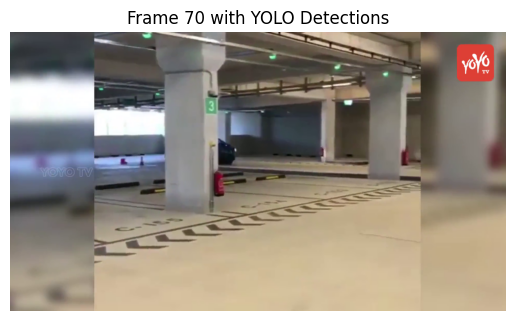

In [133]:
from ultralytics import YOLO

model = YOLO('yolov8n.pt')

video = cv2.VideoCapture('/kaggle/input/object-tracking-car/car.mp4')

frame_count = 0
max_frames = 15 
processed_frames = 0  

while processed_frames < max_frames:
    success, frame = video.read()
    if not success:
        break

    if frame_count % 5 == 0:
        results = model(frame)  

        # Process results
        for result in results:
            boxes = result.boxes 
            for box in boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0]) 
                confidence = box.conf[0]  
                label = box.cls[0]  

                if confidence > 0.5:
                    cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(frame, f'Class: {int(label)}, Conf: {confidence:.2f}', 
                                (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) 
        plt.axis('off')
        plt.title(f"Frame {frame_count} with YOLO Detections")
        plt.show()

        processed_frames += 1

    frame_count += 1

video.release()


0: 384x640 1 person, 143.3ms
Speed: 1.7ms preprocess, 143.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


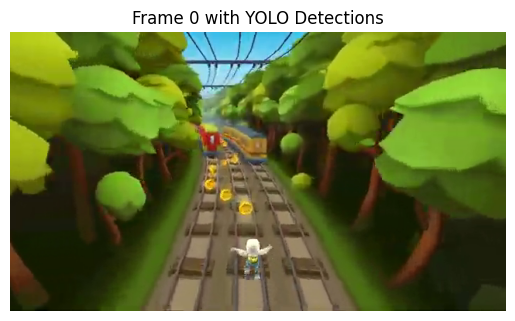


0: 384x640 1 car, 1 bus, 1 train, 135.5ms
Speed: 1.7ms preprocess, 135.5ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


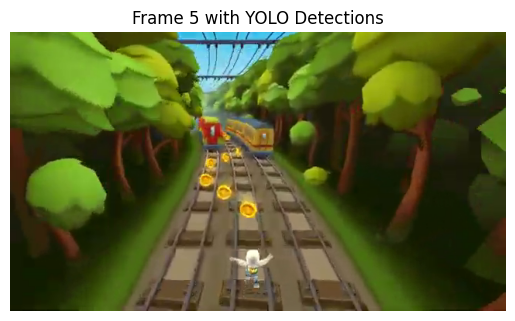


0: 384x640 2 trains, 135.8ms
Speed: 3.3ms preprocess, 135.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


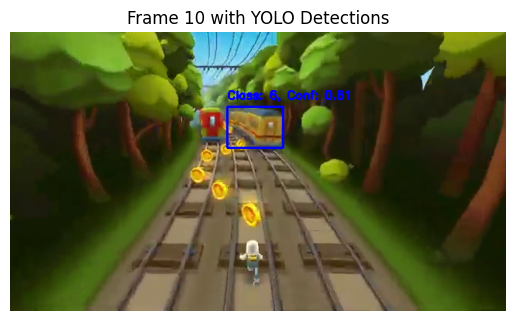


0: 384x640 2 trains, 136.1ms
Speed: 2.2ms preprocess, 136.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


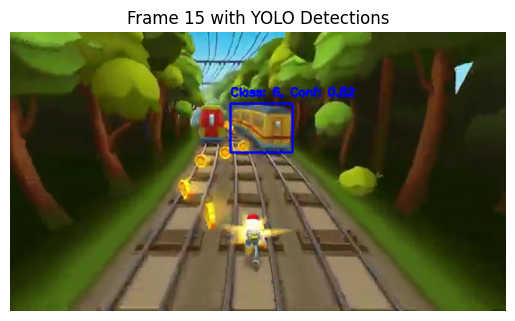


0: 384x640 2 trains, 138.3ms
Speed: 1.9ms preprocess, 138.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


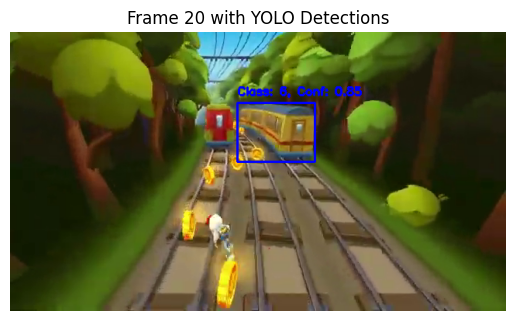


0: 384x640 1 train, 1 banana, 138.6ms
Speed: 2.0ms preprocess, 138.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


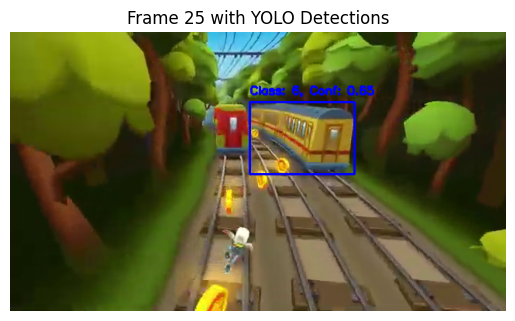


0: 384x640 2 trains, 138.2ms
Speed: 2.2ms preprocess, 138.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


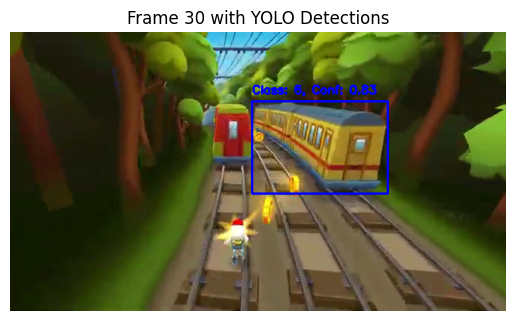


0: 384x640 2 trains, 1 carrot, 135.7ms
Speed: 1.8ms preprocess, 135.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


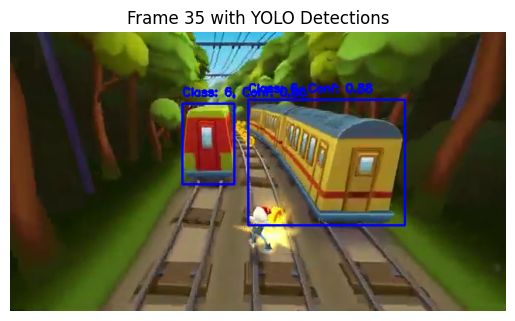


0: 384x640 2 trains, 140.8ms
Speed: 2.1ms preprocess, 140.8ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


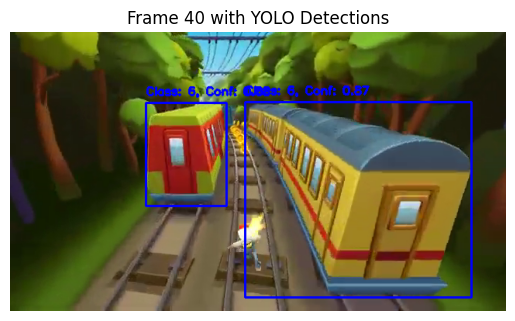


0: 384x640 2 trains, 137.4ms
Speed: 3.4ms preprocess, 137.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


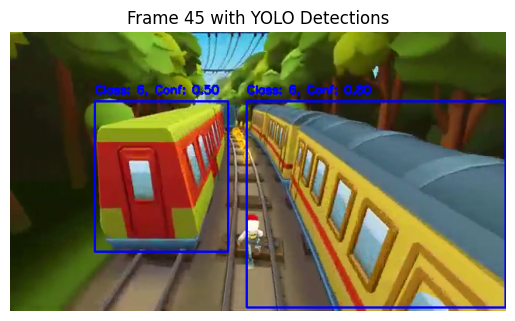


0: 384x640 1 train, 136.8ms
Speed: 2.0ms preprocess, 136.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


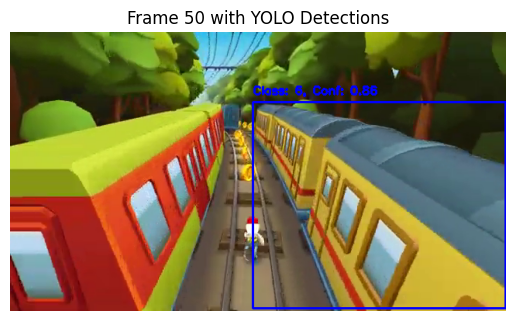


0: 384x640 1 train, 136.4ms
Speed: 2.3ms preprocess, 136.4ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


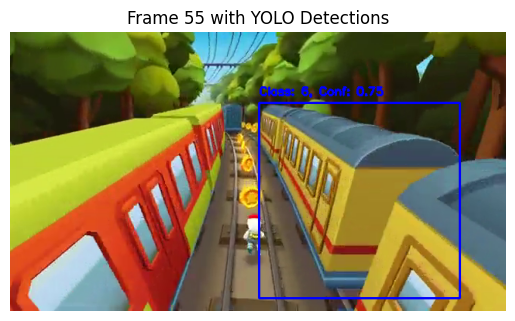


0: 384x640 1 train, 138.3ms
Speed: 1.9ms preprocess, 138.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


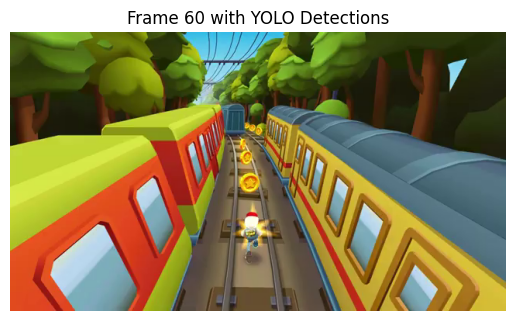


0: 384x640 1 train, 136.9ms
Speed: 2.0ms preprocess, 136.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


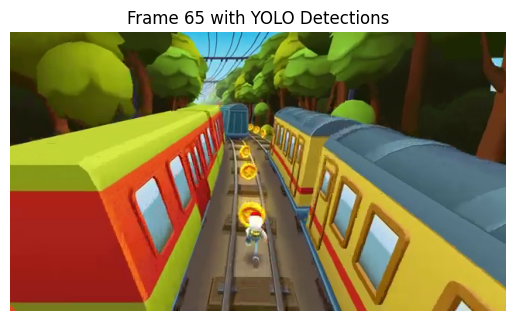


0: 384x640 1 bus, 1 bench, 1 chair, 138.7ms
Speed: 1.6ms preprocess, 138.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


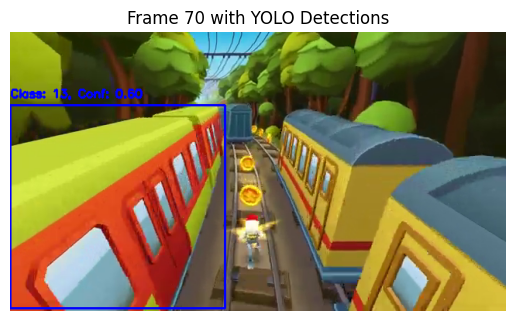

In [134]:
model = YOLO('yolov8n.pt')

video = cv2.VideoCapture('/kaggle/working/downloaded_video.mp4')

time_in_seconds = 10
fps = video.get(cv2.CAP_PROP_FPS)
frame_number = int(time_in_seconds * fps)  

video.set(cv2.CAP_PROP_POS_FRAMES, frame_number)

frame_count = 0
max_frames = 15 
processed_frames = 0  

while processed_frames < max_frames:
    success, frame = video.read()
    if not success:
        break

    if frame_count % 5 == 0:
        results = model(frame)  

        # Process results
        for result in results:
            boxes = result.boxes 
            for box in boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0]) 
                confidence = box.conf[0]  
                label = box.cls[0]  

                if confidence > 0.5:
                    cv2.rectangle(frame, (x1, y1), (x2, y2), (255, 0, 0), 2)
                    cv2.putText(frame, f'Class: {int(label)}, Conf: {confidence:.2f}', 
                                (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)

        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)) 
        plt.axis('off')
        plt.title(f"Frame {frame_count} with YOLO Detections")
        plt.show()

        processed_frames += 1

    frame_count += 1

video.release()

YOLO (You Only Look Once) is a real-time object detection algorithm that uses CNN to identify and classify multiple objects in images and videos, In contrast, MIL (Multiple Instance Learning) Tracker focuses on learning the object's appearance over time by initializing ROI (with a bounding box), updating the model using positive and negative samples during tracking, and relying on the appearance model to handle variations in object position and appearance .